In [ ]:
!wget https://data.keithito.com/data/speech/LJSpeech-1.1.tar.bz2
!tar -xjf LJSpeech-1.1.tar.bz2

--2021-12-20 17:39:19--  https://data.keithito.com/data/speech/LJSpeech-1.1.tar.bz2
Resolving data.keithito.com (data.keithito.com)... 174.138.79.61
Connecting to data.keithito.com (data.keithito.com)|174.138.79.61|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2748572632 (2.6G) [application/octet-stream]
Saving to: ‘LJSpeech-1.1.tar.bz2’

LJSpeech-1.1.tar.bz 100%[===================>]   2.56G  37.4MB/s    in 73s     

2021-12-20 17:40:32 (36.1 MB/s) - ‘LJSpeech-1.1.tar.bz2’ saved [2748572632/2748572632]



In [43]:
!pip install -r requirements.txt

     |████████████████████████████████| 10.3 MB 9.5 MB/s 
     |████████████████████████████████| 1.7 MB 32.3 MB/s 
     |████████████████████████████████| 15.3 MB 35.5 MB/s 
     |████████████████████████████████| 97 kB 6.4 MB/s 
     |████████████████████████████████| 140 kB 48.4 MB/s 
     |████████████████████████████████| 180 kB 45.0 MB/s 
     |████████████████████████████████| 63 kB 1.7 MB/s 
  Created wheel for subprocess32: filename=subprocess32-3.5.4-py3-none-any.whl size=6502 sha256=ee83e8dd7da33533e3934f4b64f10331c2632894a7178f53d811d0c075f8b94b
  Stored in directory: /root/.cache/pip/wheels/50/ca/fa/8fca8d246e64f19488d07567547ddec8eb084e8c0d7a59226a
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9672 sha256=49e4d2bb36f5b7856d21a56f45ab654a3f9b48c40c7e731b07c4f7e3103fcfb9
  Stored in directory: /root/.cache/pip/wheels/a1/b6/7c/0e63e34eb06634181c63adacca38b79ff8f35c37e3c13e3c02
  Created wheel for pathtools: filename=pathtools-0.1.2-py3-none-any.whl size=8

In [ ]:
import torch
import librosa
import torchaudio
from torch import nn
from dataclasses import dataclass
from typing import Tuple, Optional, List, Union
from torch.nn.utils.rnn import pad_sequence
import matplotlib.pyplot as plt

# Evaluation on test data

In [44]:
from src.model import Generator

model = Generator(80).to('cuda')

In [55]:
model.load_state_dict(torch.load('hifigan165957'))
model.eval()

Generator(
  (input_conv): Conv1d(80, 256, kernel_size=(7,), stride=(1,), padding=(3,))
  (layers): Sequential(
    (0): Sequential(
      (0): LeakyReLU(negative_slope=0.1)
      (1): ConvTranspose1d(256, 128, kernel_size=(16,), stride=(8,), padding=(4,))
      (2): MRF(
        (layers): ModuleList(
          (0): ResBlock(
            (layers): ModuleList(
              (0): Sequential(
                (0): LeakyReLU(negative_slope=0.1)
                (1): Conv1d(128, 128, kernel_size=(3,), stride=(1,), padding=(1,))
              )
              (1): Sequential(
                (0): LeakyReLU(negative_slope=0.1)
                (1): Conv1d(128, 128, kernel_size=(3,), stride=(1,), padding=(2,), dilation=(2,))
              )
            )
          )
          (1): ResBlock(
            (layers): ModuleList(
              (0): Sequential(
                (0): LeakyReLU(negative_slope=0.1)
                (1): Conv1d(128, 128, kernel_size=(5,), stride=(1,), padding=(4,), dilation=(2

In [56]:
import os
from src.featurizer import MelSpectrogram, MelSpectrogramConfig
test_wavs = os.listdir('test_wavs')
featurizer = MelSpectrogram(MelSpectrogramConfig()).to('cuda')

In [57]:
from IPython import display

Track 0
Prediction


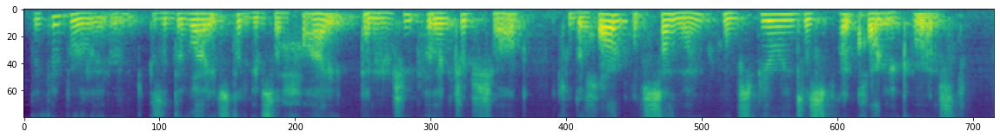

Truth


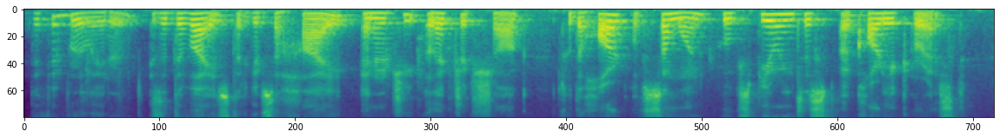

Difference


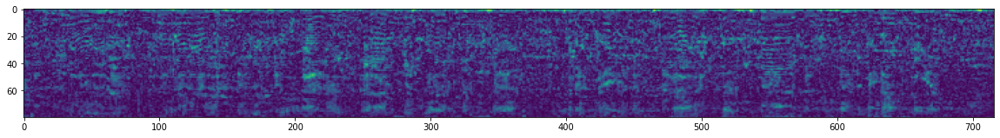

Track 1
Prediction


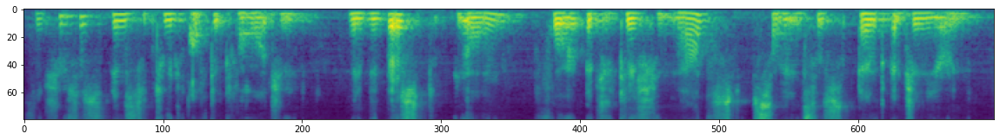

Truth


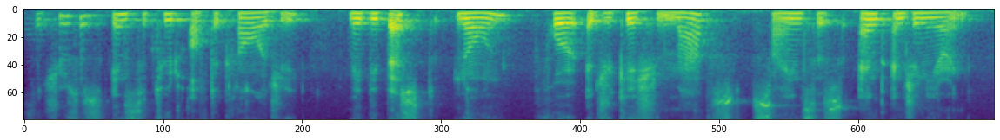

Difference


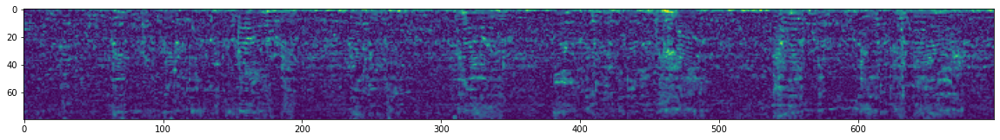

Track 2
Prediction


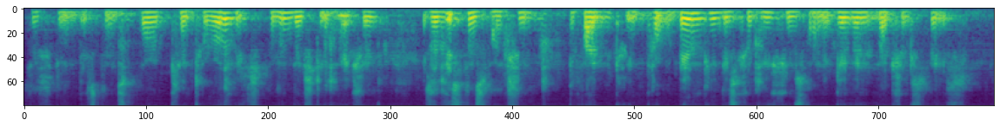

Truth


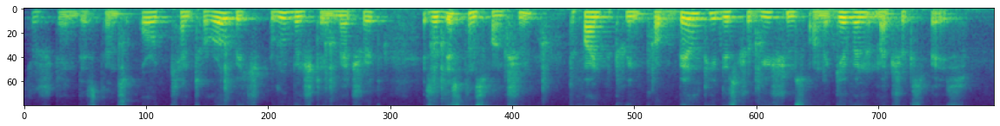

Difference


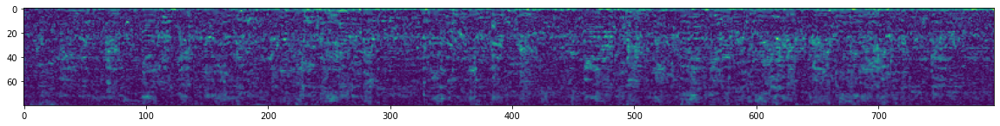

In [58]:
with torch.no_grad():
    for j, filename in enumerate(test_wavs):
        print(f'Track {j}')
        test_wave, _ = librosa.load(os.path.join('test_wavs', filename), sr=22050)
        test_wave = torch.Tensor(test_wave).unsqueeze(0).to('cuda')
        mels = featurizer(test_wave)
        pred = model(mels)
        pred_mels = featurizer(pred).squeeze(1)
        print('Prediction')
        display.display(display.Audio(pred.squeeze(1).cpu(), rate=22050))
        plt.figure(figsize=(20, 32))
        plt.imshow(pred_mels[0].cpu())
        plt.show()
        print('Truth')
        display.display(display.Audio(test_wave.cpu(), rate=22050))
        plt.figure(figsize=(20, 32))
        plt.imshow(mels[0].cpu().numpy())
        plt.show()
        print('Difference')
        plt.figure(figsize=(20, 32))
        plt.imshow((pred_mels[0] - mels[0]).abs().cpu().numpy())
        plt.show()

# Evaluation on train data

In [59]:
val_wavs = os.listdir('LJSpeech-1.1/wavs')

In [60]:
import random

Prediction


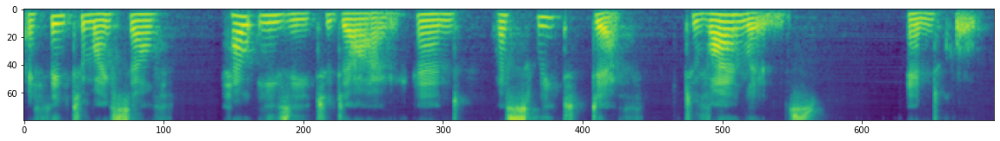

Truth


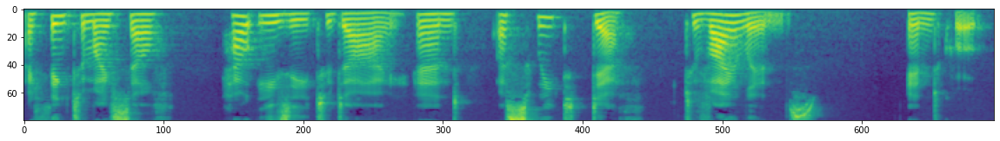

Difference


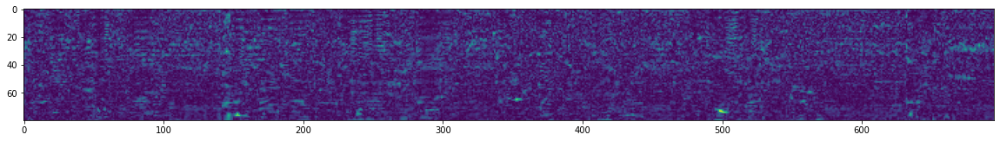

Prediction


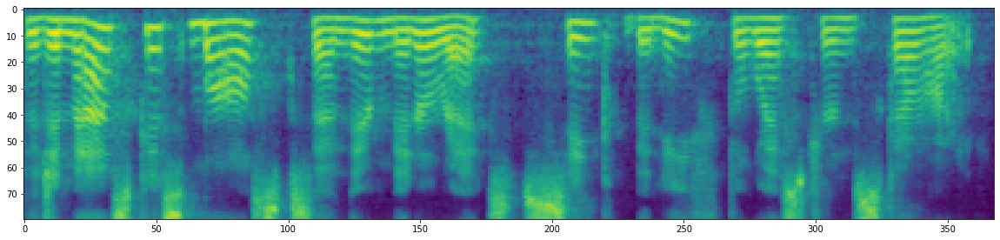

Truth


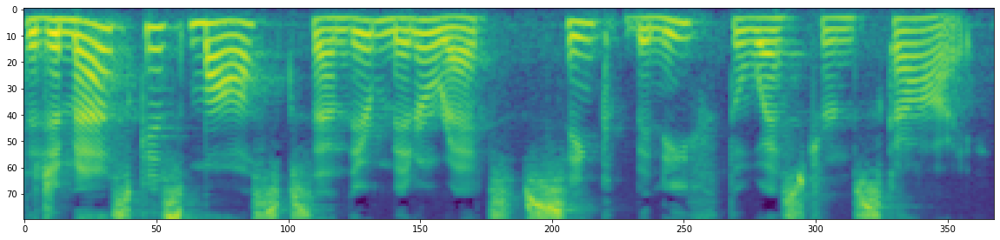

Difference


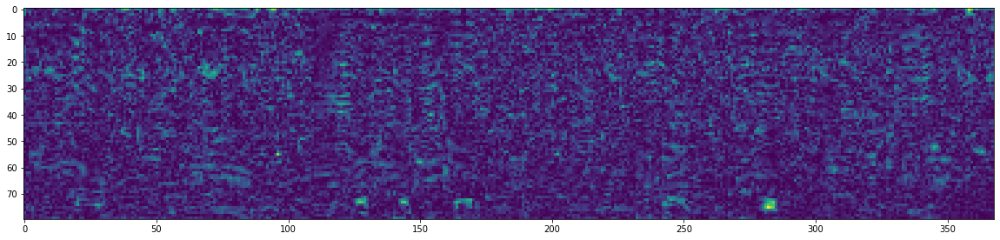

Prediction


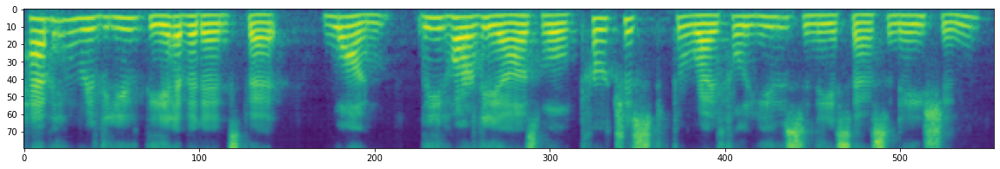

Truth


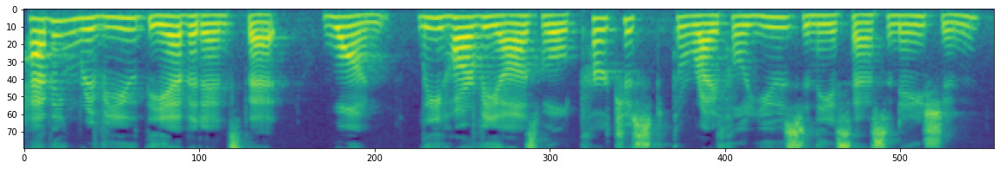

Difference


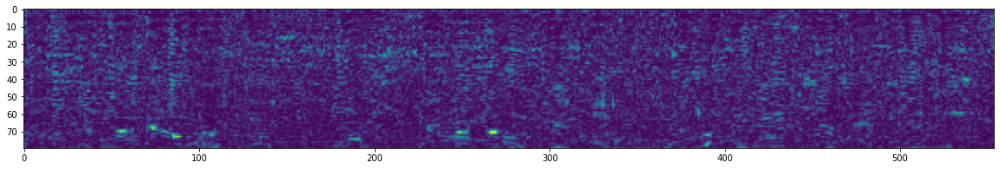

In [63]:
with torch.no_grad():
    for j in range(3):
        filename = val_wavs[random.randint(0, len(val_wavs) - 1)]
        test_wave, _ = librosa.load(os.path.join('LJSpeech-1.1/wavs', filename), sr=22050)
        test_wave = torch.Tensor(test_wave).unsqueeze(0).to('cuda')
        mels = featurizer(test_wave)
        pred = model(mels)
        pred_mels = featurizer(pred).squeeze(1)
        print('Prediction')
        display.display(display.Audio(pred.squeeze(1).cpu(), rate=22050))
        plt.figure(figsize=(20, 32))
        plt.imshow(pred_mels[0].cpu())
        plt.show()
        print('Truth')
        display.display(display.Audio(test_wave.cpu(), rate=22050))
        plt.figure(figsize=(20, 32))
        plt.imshow(mels[0].cpu().numpy())
        plt.show()
        print('Difference')
        plt.figure(figsize=(20, 32))
        plt.imshow((pred_mels[0] - mels[0]).abs().cpu().numpy())
        plt.show()